# NDVI With Dask

This tutorial notebook demonstrates how to find, visualize, and analyze the Normalized Difference Vegetation Index (NDVI) with Sentinel 2 imagery, efficiently using Dask. Sentinel 2 has a spatial resolution of 10, 20, and 60 meters and a temporal resolution of 10 days, which makes it ideal for medium scale imagery for water mapping. We will be focusing on the granules located in Southern Saskatchewan over the agricultural fields in a six year period.

**What is NDVI?**

Normalized Difference Vegetation Index (NDVI) quantifies vegetation by measuring the difference between near-infrared and red light. Near-infrared is strongly reflected by vegetation while the red light is absorbed by vegetation. It is the most common index used by researchers for remote sensing. 

NDVI always ranges from -1 to +1, however, there is no a specific boundary for each type of land cover. Such as how negative values are likely to be water, and high positive values near +1 are likely dense vegetation (forests). But when NDVI is close to zero, there aren’t green leaves and it could even be an urbanized area.

**How is NDVI calculated?**

NDVI is calculated using the Near-Infrared (NIR) and Red bands of Earth Observation satellites, in the formula:
- **`NDVI = (NIR - Red) / (NIR + Red)`**

**What do NDVI values represent?**

The formula generates a value between -1 and +1. If the resulting value is low, indicating low reflectance, then you have less or no vegetation. In contrast, higher values indicate higher reflectance and healthier vegetation.


## 1. Initialize your Dask Gateway Clusters
Since we want data over a large period of time for our analysis, running the computation using the cores of the machine we are running this notebook on is not ideal. Let's connect to Dask Gateway so we can create a cluster that can run our work. 

For now, we will set our cluster to scale to 150 workers, since our computation on a large quantity of data will require large amount of storage. 


In [1]:
# First initialize the modules 
import os
import glob
import re
import datetime
import requests

import hvplot.xarray
import holoviews
import dask
import rasterio

import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from dask_gateway import Gateway
from dask.distributed import wait, progress

In [2]:
gateway = Gateway()

# Cluster configuration 
options = gateway.cluster_options()
options

In [3]:
cluster = gateway.new_cluster(options)
cluster

In [4]:
# Scale the cluster
workers = 150
cluster.scale(workers) 

In [5]:
# Assign client to this cluster so Dask knows to use it for computations
client = cluster.get_client() 

In [6]:
client.wait_for_workers(workers-9)
cluster

## 2. Get the Sentinel 2 Data
The Google cloud Platform provides Sentinel 2 satellite images for public use. The **"gcp-public-data-sentinel-2"** mount located in the GEOAnalytics folders also provide access to the JP2 images. 

The function `get_sentinel_data()` below retrieves and loads the location of the sentinel data you want into a dataframe to be used later. Here are the steps of the function:
1. The function takes the Sentinel 2 Tile Number of the specific Tile on Earth's surface, the Relative Orbit Number (RON), and the desired bands as input, to collect just that subset of data. The RON we will be using is R084 because the granule covers the entire geographical space within that tile.
2. The locations of the resulting filepaths will be stored in a pandas dataframe along with their acquisition date. 
3. We will be using the *gcp-public-data-sentinel-2* public mount to iterate through the folders for the individual filenames.
    - glob.glob() retrieves the list of paths matching the pathname.
4. Get the lists (one for each band) of files from the subfolders of the specified RON and the desired bands.
5. Iterate through the lists and add each image's individual bands and date as dataframe row:
    - Get the date of the current file being searched.
    - Replace the home directory path of the folder with the base domain: *'https://storage.googleapis.com/'*
    - Create a dictionary containing the acquisition date and bands
    - Append the dictionary as a row to the dataframe. 
    
** We are replacing the GEOAnalytics directory path to use the GCP URLs because our Dask workers are being run on different machines that may not have access to the GEOAnalytics file system. To make sure our workers can access the same data, we will use the URLs to the files.

In [7]:
def get_sentinel_data(tile, ron, bands_wanted):
    # 2. Create dataframe to store the path to the granules we want
    df = pd.DataFrame()
    # 3. Get the path of folders, and returns an iterable
    utm = tile[1:3]
    latitude = tile[3]
    direction = tile[4:6]
    dir_path = glob.glob(f'/home/jovyan/gcp-public-data-sentinel-2/tiles/{utm}/{latitude}/{direction}/S2A*{ron}*/GRANULE')
    
    # 4. Get list of all the files with the wanted bands
    #rons = glob(f'{dir_path[0]}/S2A*{ron}*')
    date = 0
    for folder in dir_path:
        band0 = glob.glob(f'{folder}/*/IMG_DATA/*{bands_wanted[0]}.jp2')
        band1 = glob.glob(f'{folder}/*/IMG_DATA/*{bands_wanted[1]}.jp2')
        
        # Check if both files exist
        if not (os.path.isfile(band0[0]) or os.path.isfile(band1[0])):
            continue
        
        ymd = '\d{4}\d{2}\d{2}' # year, month, day
        get_date = re.search(ymd, band0[0])
        new_date = datetime.datetime.strptime(get_date.group(), '%Y%m%d').date()
        if (new_date == date): 
            continue
        date = new_date
        
        #use the path to the GCP url instead of the mounted bucket
        band0[0] = band0[0].replace('/home/jovyan/','https://storage.googleapis.com/')
        band1[0] = band1[0].replace('/home/jovyan/','https://storage.googleapis.com/')
                
        file_dict = {'date':date, bands_wanted[0]:band0[0], bands_wanted[1]:band1[0]} 
        df = df.append(file_dict,ignore_index=True)
            
    return df

In [8]:
%%time
sentinel_df = get_sentinel_data('T13UCR', 'R084', ['B04', 'B08'])
sentinel_df

CPU times: user 943 ms, sys: 159 ms, total: 1.1 s
Wall time: 1min 20s


,B04,B08,date
0,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2015-10-06
1,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2015-11-15
2,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2016-01-04
3,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2016-02-03
4,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2016-03-04
...,...,...,...
165,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2021-07-26
166,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2021-08-05
167,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2021-08-15
168,https://storage.googleapis.com/gcp-public-data...,https://storage.googleapis.com/gcp-public-data...,2021-08-25


***Important Note*: Sentinel 2A Level 1 tiles are being used in this example which contains orthorectified data. In future scientific workflows, we will show how to atmospherically correct our data and explore other preprocessing steps.**


## 3. Calculating the NDVI

Now that we have all the data in the right place, let's compute the NDVI on the data! To efficiently get the NDVI for all the data, we will need a few helper functions.

**3.1 Normalization Function**

Normalization is a procedure of adjusting values measured on a different scale to a common scale. We will normalize the data so the computation of NDVI is done on the same scale of values. 

In [9]:
def normalize(array):
    norm = (array - array.min()) / (array.max() - array.min())
    return norm

**3.2 Load Data Function**

With the normalization function ready, we can now construct the main function for calculating the NDVI of every raster set. The function `get_NDVI()` takes in the path of each image's individual URL for band 4 and band 8 and the Dask chunk sizes. Dask divides arrays into many small chunks that are small enough to fit into memory. We will be using Dask chunks to optimize the processing of the images. Since our JP2OpenJPEG files have 1024 x 1024 blocksize and we have over 600 files to process, let's set our chunksize to 12288 x 12288 (a larger multiple of the tile size).

In [10]:
@dask.delayed
def lazy_get_data(B4, B8, chunks={'band': 1, 'x': 12288, 'y': 12288}):
    # Read in the band url as an Xarray DataArray, getting rid of unneccessary dimensions
    red = xr.open_rasterio(B4, chunks=chunks).squeeze().drop(labels='band')
    nir = xr.open_rasterio(B8, chunks=chunks).squeeze().drop(labels='band')
    
    return (red, nir)

**3.2 Calculate the NDVI of each granule**

The next step is to load the url into a Xarray DataArray in the assigned chunksize. The `.squeeze()` removes dimensions of length 1, and the `.drop(label='band')` removes the band from coordinates of the DataArray. 
Once the DataArrays are created, we will normalize them using the helper function created above. The last step in this function is to calculate and return the NDWI using the normalized green and NIR DataArrays.

In [11]:
def get_NDVI(red, nir):
    
    #Normalize the data
    red_norm = normalize(red)
    nir_norm = normalize(nir)
    
    # Calculate the NDVI
    ndvi = (nir_norm - red_norm) / (nir_norm + red_norm)
    
    return ndvi

**3.3 Executing and storing data on the Dask Clusters**

The cell below runs the functions above to get the NDVI of each row from the dataframe created in Part 2. The results from the function call are appended to a list containing the NDVI of every granule.

The most important aspect of this computation is the **`client.persist()`**. The Client.persist() executes the function call and returns a copy of each of the dask collections with the former lazy computations now submitted to run on the cluster. Here, the copy of the collection pointing to the Futures is returned immediately. When you run cell below you will see it complete execution almost instantly, but the progress bar, created by the `progress()` built-in function of "dask.distributed", shows the computation of tasks happening in the background on the dask clusters. Now, anymore queries on this persisted collection will be run very fast. 

There is *another* method called `client.compute()` which is similar to client.persist(), however this method returns only a single Future for each collection which must fit on a single worker machine. Client.compute() is ideal for smaller results that fit in memory, otherwise too large results would fail from blowing up memory space. So for our workflow, client.persist() should be used. 


In [12]:
%%time

delayed_downloads = []
delayed_ndvi = []
for i,row in sentinel_df.iterrows():
    bands = lazy_get_data(row['B04'], row['B08'])
    delayed_ndvi.append(get_NDVI(bands[0], bands[1]))

CPU times: user 158 ms, sys: 13.1 ms, total: 172 ms
Wall time: 156 ms


**3.4 Combine the NDVI of all granules together in one DataArray**

The next step is to concatenate the list of DataArrays from the previous step with their respective dates into a Xarray DataArray.

In [13]:
delayed_ndvi_concat = dask.delayed(xr.concat)(delayed_ndvi, dim=pd.DatetimeIndex(sentinel_df['date'], name='time'))
delayed_ndvi_concat

Delayed('concat-8e71dfae-f101-49c5-8990-669e5d3860ba')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.268322 to fit


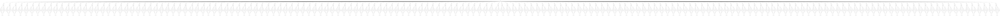

In [14]:
delayed_ndvi_concat.visualize()

In [15]:
%%time
final_ndvi = delayed_ndvi_concat.compute().persist()
progress(final_ndvi)

CPU times: user 947 ms, sys: 45.2 ms, total: 993 ms
Wall time: 23.9 s


VBox()

In [16]:
print('Dataset size (Gb): ', final_ndvi.nbytes/1e9)
final_ndvi

Dataset size (Gb):  163.962144


<xarray.DataArray (time: 170, y: 10980, x: 10980)>
dask.array<concatenate, shape=(170, 10980, 10980), dtype=float64, chunksize=(1, 10980, 10980), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 5.6e+06 5.6e+06 5.6e+06 ... 5.49e+06 5.49e+06 5.49e+06
  * x        (x) float64 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05 4.098e+05
  * time     (time) datetime64[ns] 2015-10-06 2015-11-15 ... 2021-09-04

## 4. Visualizing the Results

To see how the NDVI changes over time, we can visualize it using HoloViz's **hvplot**. It allows for interactive plots of Xarray DataArrays or Pandas Dataframes.

The cell below groups the images according to time and plots the entire dataset. Drag the slider across the panel to visualize the change of NDVI in the region over time.

In [17]:
final_ndvi.hvplot.image(groupby='time', x='x',y='y',
                  cmap='RdYlGn', clim=(-1,1),
                  rasterize=True, dynamic=True,
                  width=700, height=500)

:DynamicMap   [time]
   :Image   [x,y]   (value)

#### Analysis:

The plot above shows the NDVI in the recent 6 years, overlooking the agricultural fields in Southern Saskatchewan. The most notable changes are over the seasons. The peak in healthy vegetation as noted by the increase of high positive values (green), occurs between June and September which the harvesting season in this region. The red polygons represent water bodies, known by the negative NDVI values since water does not get reflected in the Red and the Near-Infrared bands. 


Let's see the annual change in NDVI in 2020 around Regina, the capital of Saskwatchen, on a line graph. You can use the website https://www.geoplaner.com to get the coordinates in UTM Zone 18N. Let's set a buffer of 5 kilometers to analyize values within that radius. We will select the x and y values within 5 km and for the year 2020, from our NDVI DataArray.  and plot as a line graph.

In [18]:
#UTM zone 18N coordinates near Regina
xcen = 355844
ycen = 5540033
buf = 5000  # look at point +/- 5km

Text(0.5, 1.0, 'Annual change of NDVI (2020)')

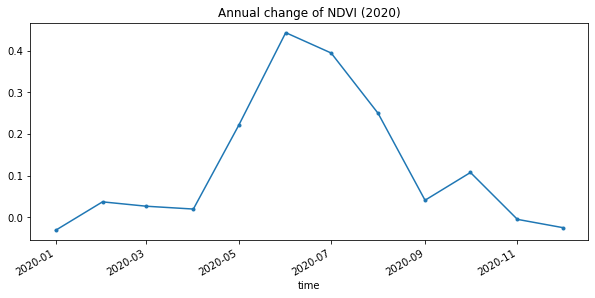

In [19]:
annual = final_ndvi.sel(x=slice(xcen-buf,xcen+buf), y=slice(ycen+buf,ycen-buf), time=slice('2020-01-01', '2021-01-01'))
annual_timeseries = annual.resample(time='1MS').mean().persist()

annual_timeseries.isel(x=1,y=1).plot.line(figsize=(10,4), marker='.')
plt.title("Annual change of NDVI (2020)")

As you can see, the peak in healthy vegetation occurs at the beginning of Harvest season in June-July, which are the Summer months in Canada. NDVI is quite low in other times of the year, noted by the values around 0.

Now let's see if there has been a change in NDVI over the past 6 years, and whether the change is negative or positive. The cell below does the same computations as above but over the entire time period of the data. 

Text(0.5, 1.0, 'NDVI Variation over 6 years')

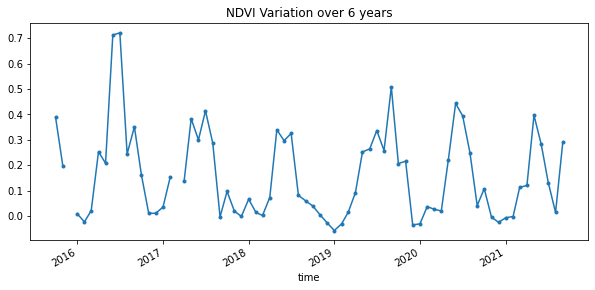

In [20]:
full_variation = final_ndvi.sel(x=slice(xcen-buf,xcen+buf), y=slice(ycen+buf,ycen-buf))
full_timeseries = full_variation.resample(time='1MS').mean().persist()

full_timeseries.isel(x=1,y=1).plot(figsize=(10,4), marker='.')
plt.title("NDVI Variation over 6 years")

Now, from the previous plot we know the values peak in Summer season and we have 6 peaks so far for each year's summer. Notice the change in NDVI from 2016 to 2021 with the values dractically decrease from ~0.7 to ~0.4. The high NDVI values in 2016 explain much healthier vegetation during that period. 


Now that you have worked through this notebook, you should have a better grasp on using the powers of Dask to scale large quantities of data for substantial analysis!

#### Make sure to always explicitly shut down computing resources when you're not using them!

In [21]:
cluster.close()
client.close()